In [3]:
import matplotlib.pyplot as plt
import numpy as np
import librosa
import soundfile as sf
import os
import librosa
import librosa.display

## Reconstruction assumptions
1. high Q leads to less frequential information loss
2. big T causes losing temporal information
3. big J leads to less low frequency loss
4. T>2^J temporal smear; T<2^J bigger j would differ that much since might overlap within LPF

In [7]:
sound_dir = "../audio/reconstructed_chick/"
original,sr = sf.read("../audio/contact_call.wav")
reconstructed = {}
for file in os.listdir(sound_dir):
    j = int(file.split("_")[1][1:])
    q = int(file.split("_")[2][1:])
    t = int(file.split("_")[3].split(".")[0][1:])
    recon,sr = sf.read(os.path.join(sound_dir,file))
    reconstructed[(j,q,t)] = recon
    #print(file,j,q,t)

In [31]:
#test Q tendency: fix J,T to be equal 
J = [6,8,12]
Q = [10,12,14]
fig,axes = plt.subplots(nrows=len(J),ncols=len(Q)+1,figsize=(12,12))
for a,j in enumerate(J):
    for b,q in enumerate(Q):
        axes[a,b].specgram(reconstructed[(j,q,j-2)],Fs=sr)
        axes[a,b].set_title("J="+str(j)+", Q="+str(q)+", T=2^"+str(j-2))
    axes[a,3].specgram(np.mean(original,axis=1),Fs=sr)
    axes[a,3].set_title("original")
        
     

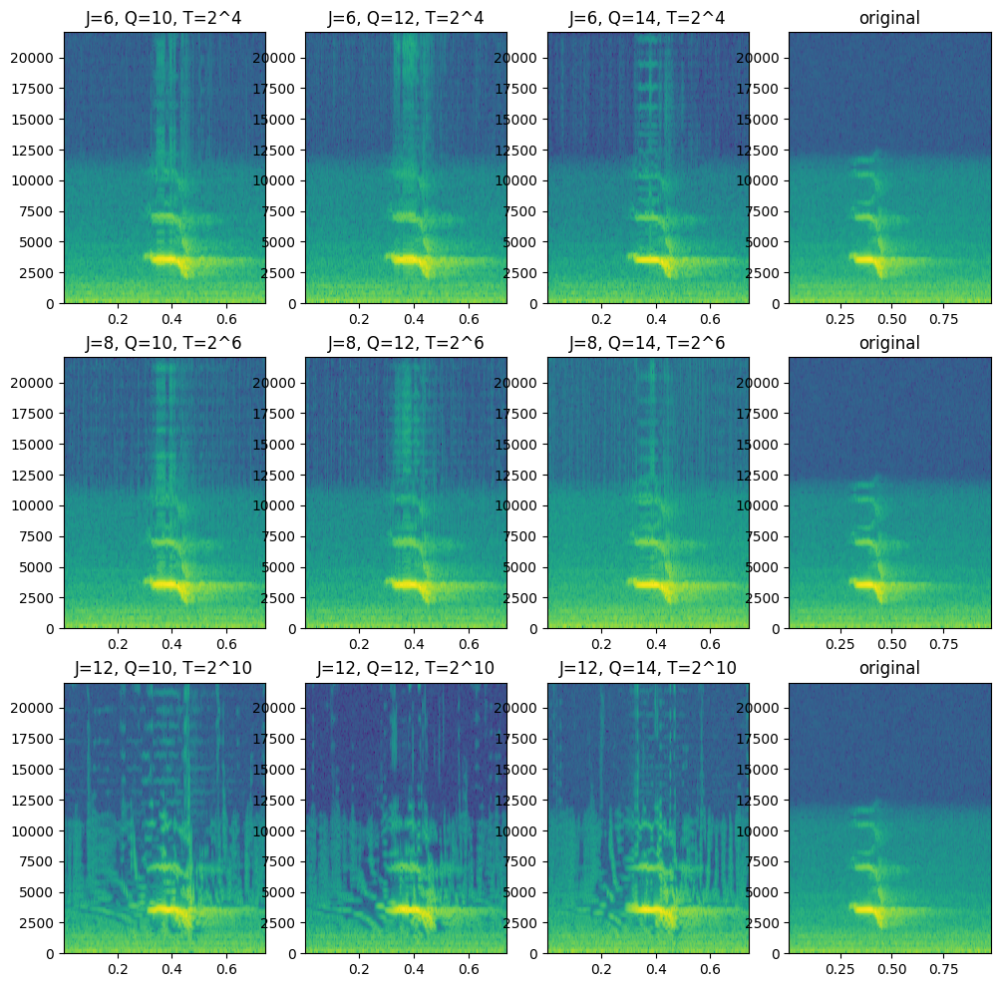

In [32]:
plt.show()

conclusion:
    this comparison can show: 
1. big T loses temporal information, 2^12 and 2^10 makes a huge difference in terms of time-averaging
2. high Q causes more finegrained noise in high frequency reconstruction, but it doesn't necessarily preserve the pitch bend structure well? 
3. can't tell if big J has an effect on preserving low frequency since this particular sound example is pretty high pitched. and no slow-enveloped modulation really exists.

In [30]:
#lowest center frequency of the filter fmin = 0.4*fs/2^J
fmin1 = 0.4*sr/2**12
fmin2 = 0.4*sr/2**8
fmin3 = 0.4*sr/2**6 #J 
print(fmin1,fmin2,fmin3) #in hz


4.306640625 68.90625 275.625


In [37]:
#test T and J relationship tendency: 
J = [6,8,12]
q = 12
fig,axes = plt.subplots(nrows=len(J),ncols=len(Q)+1,figsize=(12,12))
for a,j in enumerate(J):
    axes[a,0].specgram(reconstructed[(j,q,j)],Fs=sr)
    axes[a,0].set_title("J="+str(j)+", Q="+str(q)+", T=2^"+str(j))
    axes[a,1].specgram(reconstructed[(j,q,j-2)],Fs=sr)
    axes[a,1].set_title("J="+str(j)+", Q="+str(q)+", T=2^"+str(j-2))
    axes[a,2].specgram(reconstructed[(j,q,j+2)],Fs=sr)
    axes[a,2].set_title("J="+str(j)+", Q="+str(q)+", T=2^"+str(j+2))
    axes[a,3].specgram(np.mean(original,axis=1),Fs=sr)
    axes[a,3].set_title("original")

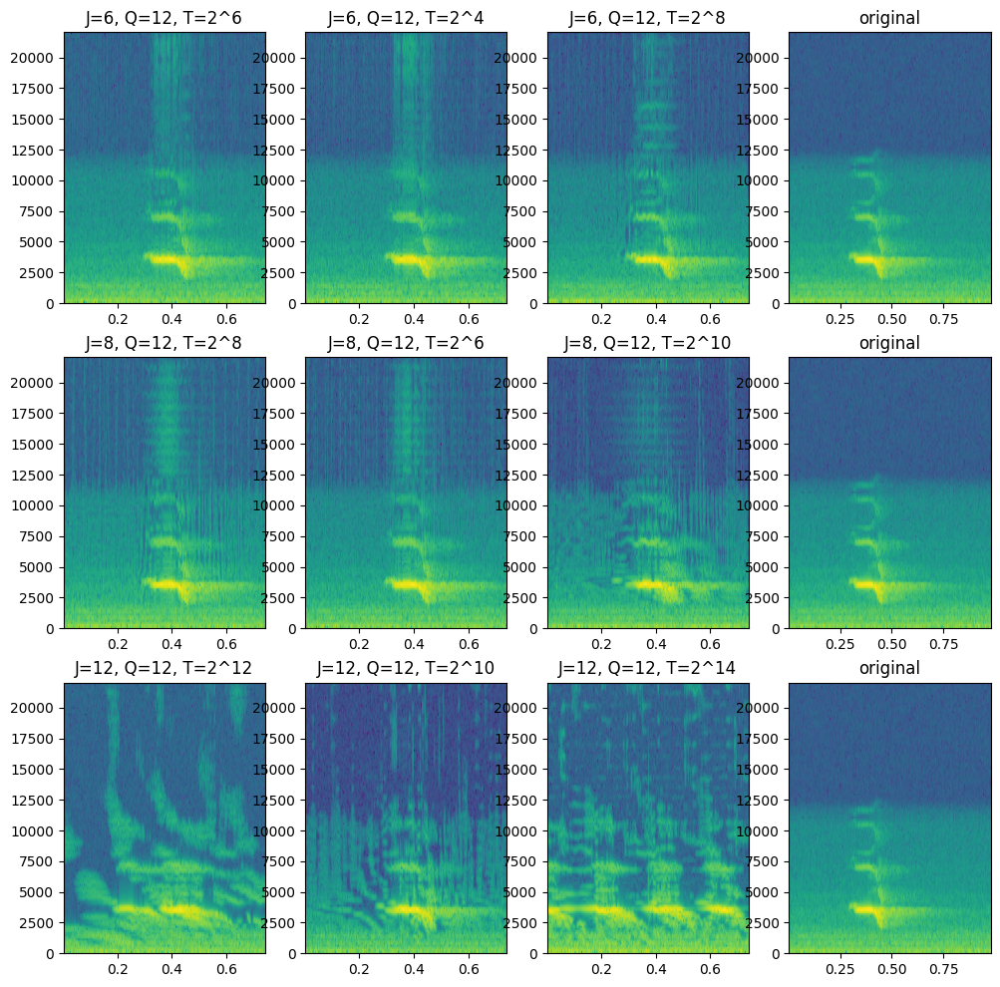

In [38]:
plt.show()

conclusion:
1. when LPF time support exceeds lowest filter time support there is ambiguity in temporal evolution, when it's smaller it seems to be less noisy in terms of reconstruction.
2. don't know if there is problem with fixing LPF time support but vary J

## spiegel sounds

In [52]:
2**15

32768

In [256]:
sound_dir = "../audio/reconstructed_spiegel/"
original,sr = sf.read("../audio/spiegel-patchwork.wav")
reconstructed_s = {}
for file in os.listdir(sound_dir):
    j = int(file.split("_")[2][1:])
    q = int(file.split("_")[3][1:])
    t = int(file.split("_")[4].split(".")[0][1:])
    recon,sr = sf.read(os.path.join(sound_dir,file))
    reconstructed_s[(j,q,t)] = recon
    #print(j,q,t)

In [259]:
#test Q tendency: fix T to be smaller than J (might be low freq gaps)
J = [10,12,14]
Q = [10,12,14]
fig,axes = plt.subplots(nrows=len(J),ncols=len(Q)+1,figsize=(25,12))
for a,j in enumerate(J):
    for b,q in enumerate(Q):
        axes[a,b].specgram(reconstructed_s[(j,q,j-2)],Fs=sr,cmap="magma_r",scale="linear")
        axes[a,b].set_ylim([0,3000])
        axes[a,b].set_title("J="+str(j)+", Q="+str(q)+", T=2^"+str(j-2))
    axes[a,3].specgram(original[:2**15],Fs=sr,cmap="magma_r",scale="linear")
    axes[a,3].set_ylim([0,3000])
    axes[a,3].set_title("original")

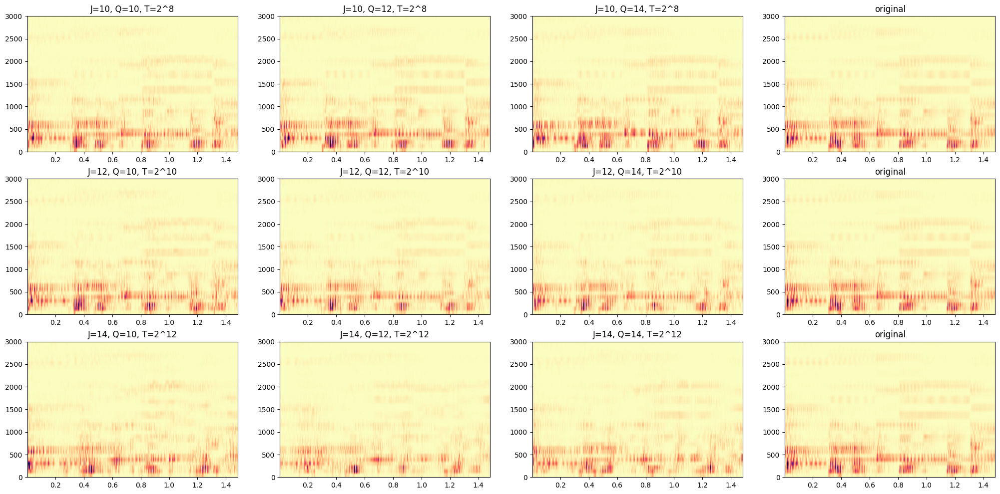

In [260]:
plt.show()
# magnify range of Q: try Q = 8, 16 to verify this indeed has an effect 
# find a sound with tremolo

In [60]:
#test Q tendency: fix T to be 8 (no low freq gaps but loses temporal info)
J = [10,12,14]
Q = [10,12,14]

fig,axes = plt.subplots(nrows=len(J),ncols=len(Q)+1,figsize=(12,12))
for a,j in enumerate(J):
    for b,q in enumerate(Q):
        axes[a,b].specgram(reconstructed_s[(j,q,8)],Fs=sr)
        axes[a,b].set_title("J="+str(j)+", Q="+str(q)+", T=2^"+str(8))
    axes[a,3].specgram(original[:2**15],Fs=sr)
    axes[a,3].set_title("original")

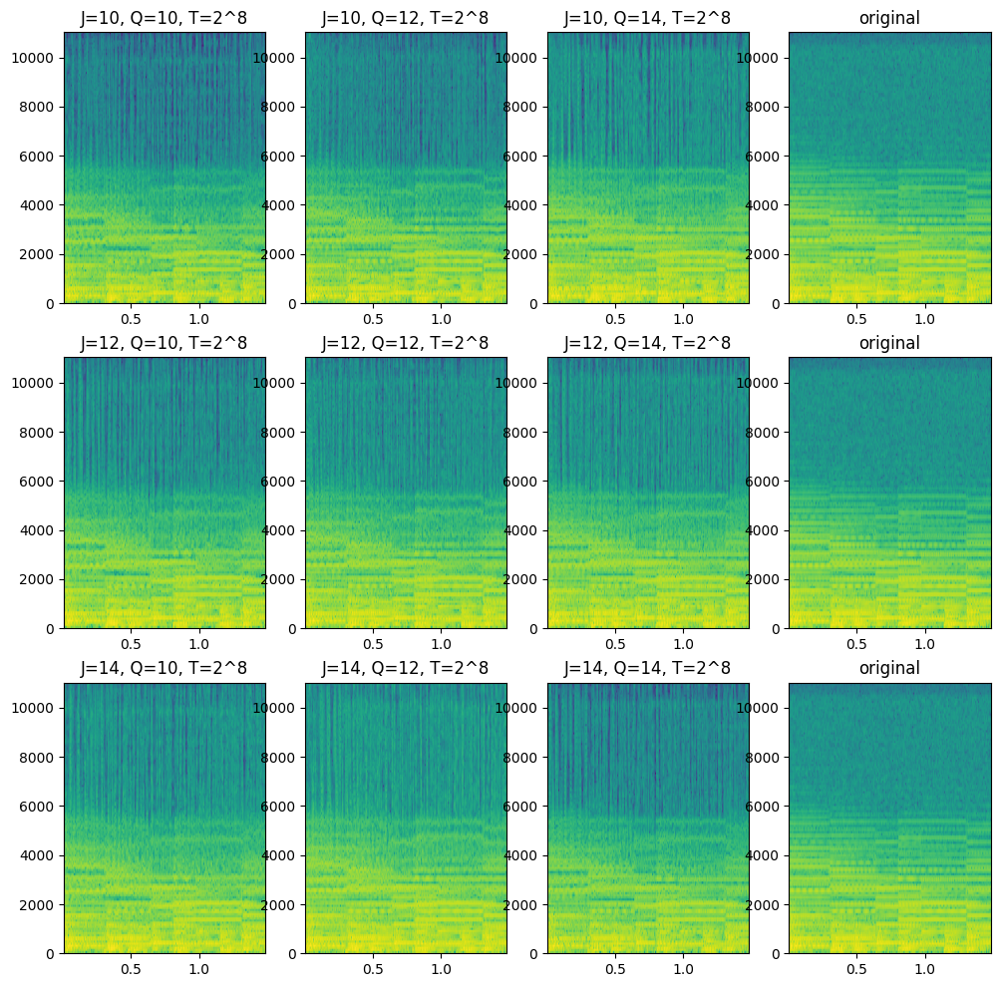

In [61]:
plt.show()

## trill

In [77]:
sound_dir = "../audio/reconstructed_flutetrill/"
original,sr = sf.read("../audio/flute_trill.wav")
reconstructed_trill = {}
for file in os.listdir(sound_dir):
    j = int(file.split("_")[2][1:])
    q = int(file.split("_")[3][1:])
    t = int(file.split("_")[4].split(".")[0][1:])
    recon,sr = sf.read(os.path.join(sound_dir,file))
    reconstructed_trill[(j,q,t)] = recon
    #print(j,q,t)

In [71]:
#effect of J, take Q=12
J = [6,12,14]
q = 12
T = [10,12,14]

fig,axes = plt.subplots(nrows=len(J),ncols=len(Q)+1,figsize=(12,12))
for a,j in enumerate(J):
    for b,t in enumerate(T):
        axes[a,b].specgram(reconstructed_trill[(j,q,t)],Fs=sr)
        axes[a,b].set_title("J="+str(j)+", Q="+str(q)+", T=2^"+str(t))
    axes[a,3].specgram(original[:2**15],Fs=sr)
    axes[a,3].set_title("original")

/Users/lilyh/anaconda3/envs/openl3/lib/python3.7/site-packages/matplotlib/axes/_axes.py:7553: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


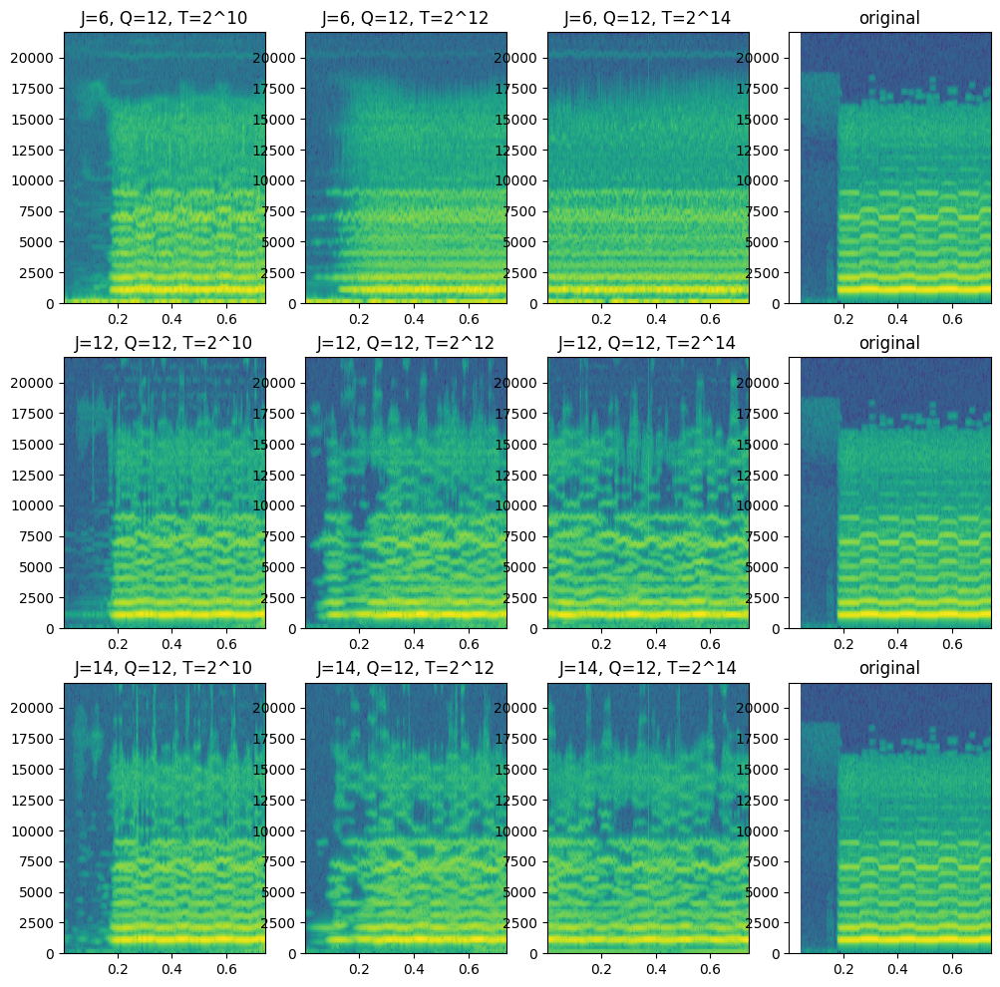

In [72]:
plt.show()

conclusion
1. j=6 to j=12 signifies a big change in terms of improvement in preserving low frequency modulation
2. big T loses temporal envelope accuracy
2. when T is small, taking j to be bigger doesn't necessarily help preserve low frequency modulation so obviously. since the freq support of low frequency is wide and it encompassed the filter with lowest center frequency 

In [80]:
#effect of Q, take J = 12
J = [6,12,14]
j = 12
Q = [6,12,18]
T = [10,12,14]

fig,axes = plt.subplots(nrows=len(J),ncols=len(Q)+1,figsize=(12,12))
for a,q in enumerate(Q):
    for b,t in enumerate(T):
        axes[a,b].specgram(reconstructed_trill[(j,q,t)],Fs=sr)
        axes[a,b].set_title("J="+str(j)+", Q="+str(q)+", T=2^"+str(t))
    axes[a,3].specgram(original[:2**15],Fs=sr)
    axes[a,3].set_title("original")

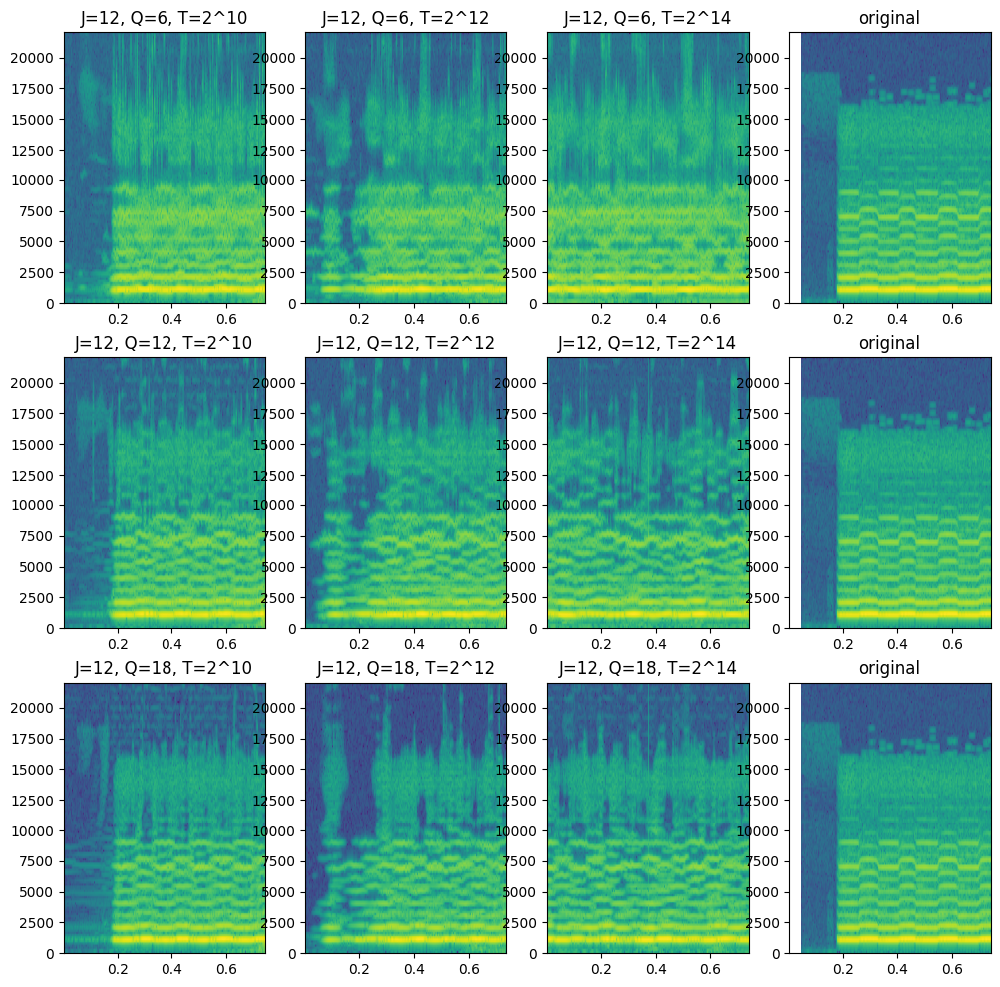

In [81]:
plt.show()

conclusion:
1. clear frequency resolution improvement when increasing Q

In [224]:
sound_dir = "../audio/reconstructed_chflute/"
original,sr = sf.read("../audio/flute_playingtechniques.wav")
reconstructed = {}
for file in os.listdir(sound_dir):
    if file[-4:]==".wav":
        mode = file.split("_")[1]
        j = int(file.split("_")[3][1:])
        q = int(file.split("_")[4][1:])
        t = int(file.split("_")[5].split(".")[0][1:])
        recon,sr = sf.read(os.path.join(sound_dir,file))
        reconstructed[(mode,j,q,t)] = recon
        N = len(recon)
        print(mode,j,q,t)


timesc 12 8 17
timesc 12 8 15
timesc 12 8 13
jtfs 12 8 13
jtfs 12 8 17
jtfs 12 8 15


In [225]:
j = 12
q = 8
T = [13,15,17]

fig,axes = plt.subplots(nrows=2,ncols=len(T)+1,figsize=(25,12))

for b,t in enumerate(T):
    axes[0,b].specgram(reconstructed[("timesc",j,q,t)],Fs=sr,cmap="magma_r",scale="linear")
    axes[0,b].set_title("timesc,J="+str(j)+", Q="+str(q)+", T=2^"+str(t))
    axes[1,b].specgram(reconstructed[("jtfs",j,q,t)],Fs=sr,cmap="magma_r",scale="linear")
    axes[1,b].set_title("jtfs,J="+str(j)+", Q="+str(q)+", T=2^"+str(t))
axes[0,3].specgram(original[:N],Fs=sr,cmap="magma_r",scale="linear")
axes[0,3].set_title("original")
axes[1,3].specgram(original[:N],Fs=sr,cmap="magma_r",scale="linear")
axes[1,3].set_title("original")

Text(0.5, 1.0, 'original')

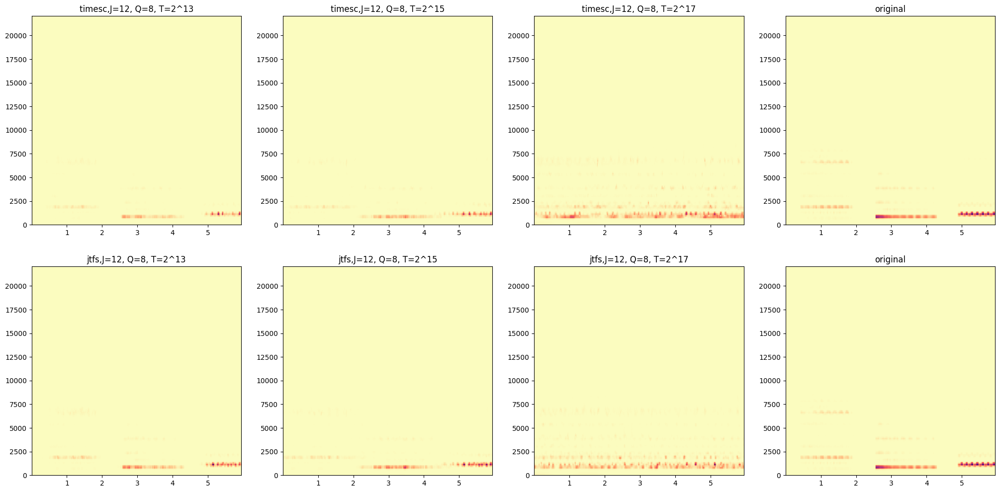

In [226]:
plt.show()

In [266]:
sound_dir = "../audio/reconstructed_contact/"
original,sr = sf.read("../audio/contact_call.wav")
original = np.mean(original,axis=1)
reconstructed_contact = {}
for file in os.listdir(sound_dir):
    if file[-4:]==".wav":
        mode = file.split("_")[1]
        j = int(file.split("_")[3][1:])
        q = int(file.split("_")[4][1:])
        t = int(file.split("_")[5].split(".")[0][1:])
        recon,sr = sf.read(os.path.join(sound_dir,file))
        reconstructed_contact[(mode,j,q,t)] = recon
        print(mode,j,q,t)


timesc 12 8 15
timesc 12 8 14
timesc 12 8 13
jtfs 12 8 13
jtfs 12 8 15
jtfs 12 8 14


In [254]:
j = 12
q = 8
T = [13,14,15]

fig,axes = plt.subplots(nrows=2,ncols=len(T)+1,figsize=(25,12))

for b,t in enumerate(T):
    axes[0,b].specgram(reconstructed[("timesc",j,q,t)],Fs=sr,cmap="magma_r",scale="linear",NFFT=512,noverlap=64)
    axes[0,b].set_ylim([1000,6000])
    axes[0,b].set_xlim([0.2,0.6])
    axes[0,b].set_title("timesc,J="+str(j)+", Q="+str(q)+", T=2^"+str(t))
    axes[1,b].specgram(reconstructed[("jtfs",j,q,t)],Fs=sr,cmap="magma_r",scale="linear",NFFT=512,noverlap=64)
    axes[1,b].set_ylim([1000,6000])
    axes[1,b].set_xlim([0.2,0.6])
    axes[1,b].set_title("jtfs,J="+str(j)+", Q="+str(q)+", T=2^"+str(t))

axes[0,3].specgram(original,Fs=sr,cmap="magma_r",scale="linear",NFFT=512,noverlap=64)
axes[0,3].set_ylim([1000,6000])
axes[0,3].set_xlim([0.2,0.6])
axes[0,3].set_title("original")
axes[1,3].specgram(original,Fs=sr,cmap="magma_r",scale="linear",NFFT=512,noverlap=64)
axes[1,3].set_title("original")

Text(0.5, 1.0, 'original')

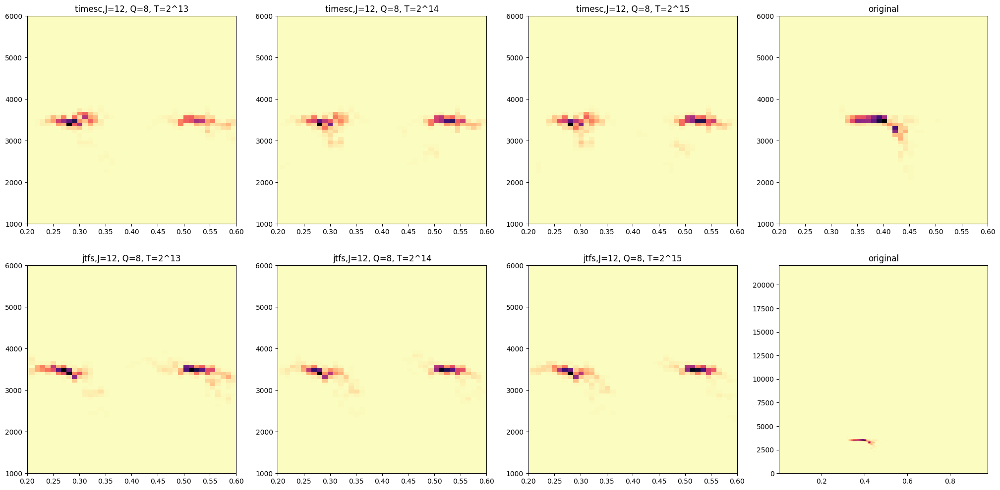

In [255]:
plt.show()

In [207]:
sound_dir = "../audio/reconstructed_chflute_q12/"
original,sr = sf.read("../audio/flute_playingtechniques.wav")
reconstructed = {}
for file in os.listdir(sound_dir):
    if file[-4:]==".wav":
        mode = file.split("_")[1]
        j = int(file.split("_")[3][1:])
        q = int(file.split("_")[4][1:])
        t = int(file.split("_")[5].split(".")[0][1:])
        recon,sr = sf.read(os.path.join(sound_dir,file))
        N = len(recon)
        reconstructed[(mode,j,q,t)] = recon
        print(mode,j,q,t,len(recon))

jtfs 12 12 13 262144
timesc 12 12 15 262144
timesc 12 12 17 262144
jtfs 12 12 15 262144
timesc 12 12 13 262144
jtfs 12 12 17 262144


In [214]:
j = 12
q = 12
T = [13,15,17]
fig,axes = plt.subplots(nrows=2,ncols=len(T)+1,figsize=(25,12))

for b,t in enumerate(T):
    axes[0,b].specgram(reconstructed[("timesc",j,q,t)],Fs=sr,cmap="magma_r",scale="linear")
    axes[0,b].set_ylim([0,7500])
    axes[0,b].set_title("timesc,J="+str(j)+", Q="+str(q)+", T=2^"+str(t))
    axes[1,b].specgram(reconstructed[("jtfs",j,q,t)],Fs=sr,cmap="magma_r",scale="linear")
    axes[1,b].set_ylim([0,7500])
    axes[1,b].set_title("jtfs,J="+str(j)+", Q="+str(q)+", T=2^"+str(t))
axes[0,3].specgram(original[:N],Fs=sr,cmap="magma_r",scale="linear")
axes[0,3].set_ylim([0,7500])
axes[0,3].set_title("original")
axes[1,3].specgram(original[:N],Fs=sr,cmap="magma_r",scale="linear")
axes[1,3].set_ylim([0,7500])
axes[1,3].set_title("original")

Text(0.5, 1.0, 'original')

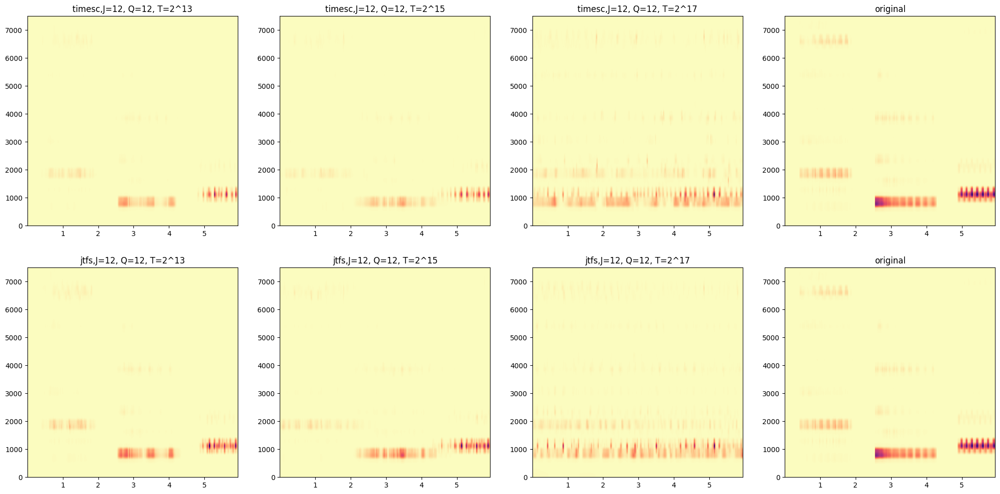

In [215]:
plt.show()

In [265]:
sound_dir = "../audio/reconstructed_westflute_q12/"
original,sr = sf.read("../audio/flute_original.wav")
reconstructed_flute = {}
for file in os.listdir(sound_dir):
    if file[-4:]==".wav":
        mode = file.split("_")[1]
        j = int(file.split("_")[3][1:])
        q = int(file.split("_")[4][1:])
        t = int(file.split("_")[5].split(".")[0][1:])
        recon,sr = sf.read(os.path.join(sound_dir,file))
        N = len(recon)
        reconstructed_flute[(mode,j,q,t)] = recon
        print(mode,j,q,t,len(recon))

jtfs 12 12 15 65536
jtfs 12 12 14 65536
timesc 12 12 15 65536
timesc 12 12 14 65536
jtfs 12 12 13 65536
timesc 12 12 13 65536


In [248]:
j = 12
q = 12
T = [13,14,15]
fig,axes = plt.subplots(nrows=2,ncols=len(T)+1,figsize=(25,12))

for b,t in enumerate(T):
    axes[0,b].specgram(reconstructed[("timesc",j,q,t)],Fs=sr,cmap="magma_r",scale="linear",NFFT=512,noverlap=64)
    axes[0,b].set_ylim([0,2000])
    axes[0,b].set_title("timesc,J="+str(j)+", Q="+str(q)+", T=2^"+str(t))
    axes[1,b].specgram(reconstructed[("jtfs",j,q,t)],Fs=sr,cmap="magma_r",scale="linear",NFFT=512,noverlap=64)
    axes[1,b].set_ylim([0,2000])
    axes[1,b].set_title("jtfs,J="+str(j)+", Q="+str(q)+", T=2^"+str(t))
axes[0,3].specgram(original[:N],Fs=sr,cmap="magma_r",scale="linear",NFFT=512,noverlap=64)
axes[0,3].set_ylim([0,2000])
axes[0,3].set_title("original")
axes[1,3].specgram(original[:N],Fs=sr,cmap="magma_r",scale="linear",NFFT=512,noverlap=64)
axes[1,3].set_ylim([0,2000])
axes[1,3].set_title("original")

Text(0.5, 1.0, 'original')

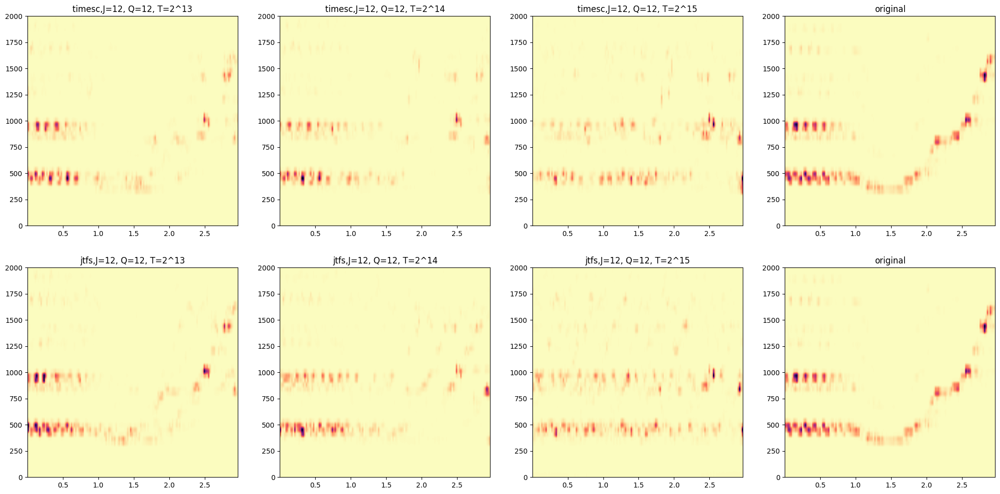

In [249]:
plt.show()

In [264]:
sound_dir = "../audio/reconstructed_spiegel_q12/" 
original,sr = sf.read("../audio/spiegel-patchwork.wav")
reconstructed_spiegel = {}
for file in os.listdir(sound_dir):
    if file[-4:]==".wav":
        mode = file.split("_")[1]
        j = int(file.split("_")[3][1:])
        q = int(file.split("_")[4][1:])
        t = int(file.split("_")[5].split(".")[0][1:])
        recon,sr = sf.read(os.path.join(sound_dir,file))
        N = len(recon)
        reconstructed_spiegel[(mode,j,q,t)] = recon
        print(mode,j,q,t,len(recon))

jtfs 12 12 13 131072
timesc 12 12 15 131072
timesc 12 12 17 131072
jtfs 12 12 15 131072
timesc 12 12 13 131072
jtfs 12 12 17 131072


In [262]:
j = 12
q = 12
T = [13,15,17]
fig,axes = plt.subplots(nrows=2,ncols=len(T)+1,figsize=(25,12))

for b,t in enumerate(T):
    axes[0,b].specgram(reconstructed[("timesc",j,q,t)],Fs=sr,cmap="magma_r",scale="linear",NFFT=512,noverlap=64)
    axes[0,b].set_ylim([0,2000])
    axes[0,b].set_title("timesc,J="+str(j)+", Q="+str(q)+", T=2^"+str(t))
    axes[1,b].specgram(reconstructed[("jtfs",j,q,t)],Fs=sr,cmap="magma_r",scale="linear",NFFT=512,noverlap=64)
    axes[1,b].set_ylim([0,2000])
    axes[1,b].set_title("jtfs,J="+str(j)+", Q="+str(q)+", T=2^"+str(t))
axes[0,3].specgram(original[:N],Fs=sr,cmap="magma_r",scale="linear",NFFT=512,noverlap=64)
axes[0,3].set_ylim([0,2000])
axes[0,3].set_title("original")
axes[1,3].specgram(original[:N],Fs=sr,cmap="magma_r",scale="linear",NFFT=512,noverlap=64)
axes[1,3].set_ylim([0,2000])
axes[1,3].set_title("original")

Text(0.5, 1.0, 'original')

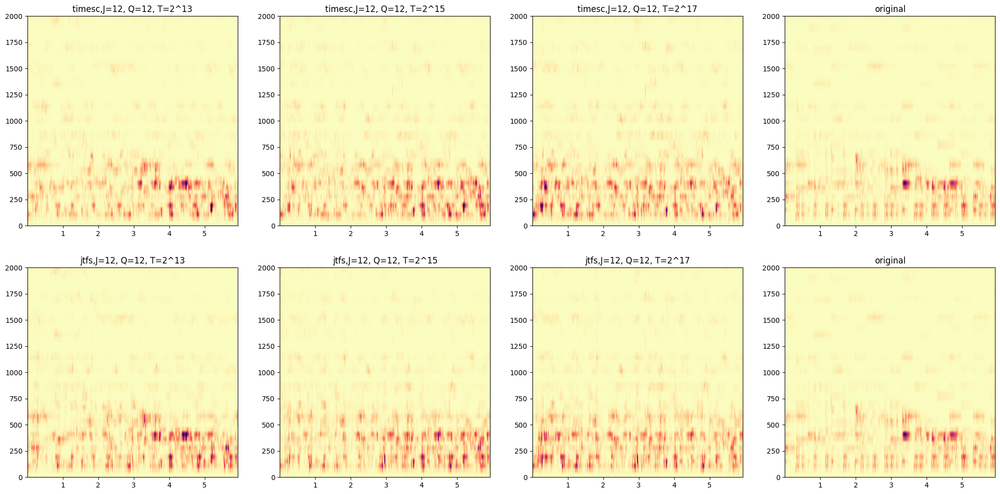

In [263]:
plt.show()

In [398]:
sound_dir = "../audio/reconstructed_bird_q12/" 
original,sr = sf.read("../audio/Tailorbird.wav")
reconstructed_bird = {}
for file in os.listdir(sound_dir):
    if file[-4:]==".wav":
        mode = file.split("_")[1]
        j = int(file.split("_")[3][1:])
        q = int(file.split("_")[4][1:])
        t = int(file.split("_")[5].split(".")[0][1:])
        recon,sr = sf.read(os.path.join(sound_dir,file))
        N = len(recon)
        reconstructed_bird[(mode,j,q,t)] = recon
        print(mode,j,q,t,len(recon))

timesc 12 12 15 131072
timesc 12 12 14 131072
timesc 12 12 13 131072
jtfs 12 12 13 131072
jtfs 12 12 15 131072
jtfs 12 12 14 131072


In [403]:
j = 12
q = 12
T = [13,14,15]
fig,axes = plt.subplots(nrows=2,ncols=len(T)+1,figsize=(25,12))
c=1e-6
for b,t in enumerate(T):
    spec1,_,_,_ = plt.specgram(reconstructed_bird[("timesc",j,q,t)],Fs=sr,cmap="magma_r",scale="linear",NFFT=512,noverlap=64)
    librosa.display.specshow(np.log1p(spec1/c),x_axis='time',sr =sr, y_axis='linear',cmap="magma_r",ax=axes[0,b])
    axes[0,b].set_ylim([1000,5000])
    axes[0,b].set_title("timesc,J="+str(j)+", Q="+str(q)+", T=2^"+str(t))
    spec2,_,_,_ = plt.specgram(reconstructed_bird[("jtfs",j,q,t)],Fs=sr,cmap="magma_r",scale="linear",NFFT=512,noverlap=64)
    librosa.display.specshow(np.log1p(spec2/c),x_axis='time',sr =sr, y_axis='linear',cmap="magma_r",ax=axes[1,b])
    axes[1,b].set_ylim([1000,5000])
    axes[1,b].set_title("jtfs,J="+str(j)+", Q="+str(q)+", T=2^"+str(t))

spec3,_,_,_ = plt.specgram(original[:N],Fs=sr,cmap="magma_r",scale="linear",NFFT=512,noverlap=64)
librosa.display.specshow(np.log1p(spec3/c),x_axis='time',sr =sr, y_axis='linear',cmap="magma_r",ax=axes[0,3])
axes[0,3].set_ylim([1000,5000])
axes[0,3].set_title("original")
spec4,_,_,_ = plt.specgram(original[:N],Fs=sr,cmap="magma_r",scale="linear",NFFT=512,noverlap=64)
librosa.display.specshow(np.log1p(spec4/c),x_axis='time',sr =sr, y_axis='linear',cmap="magma_r",ax=axes[1,3])
axes[1,3].set_ylim([1000,5000])
axes[1,3].set_title("original")

Text(0.5, 1.0, 'original')

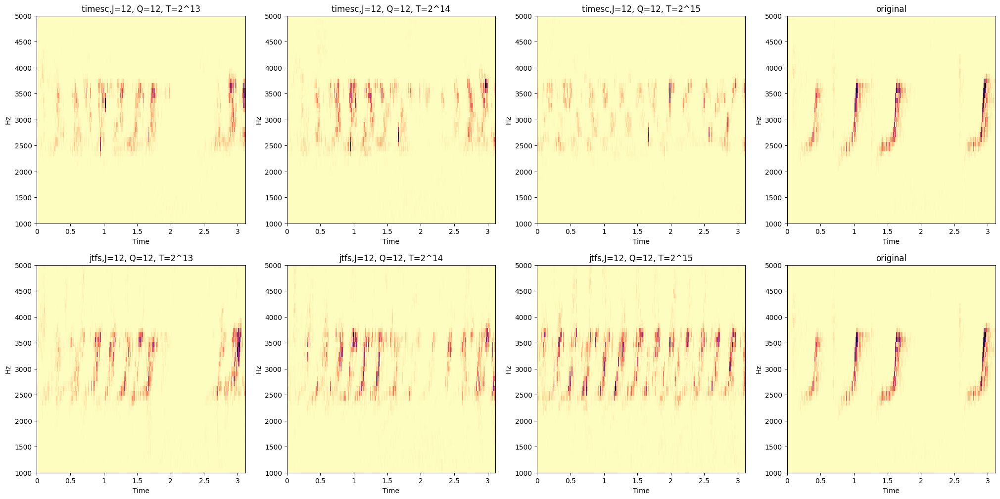

In [404]:
plt.show()

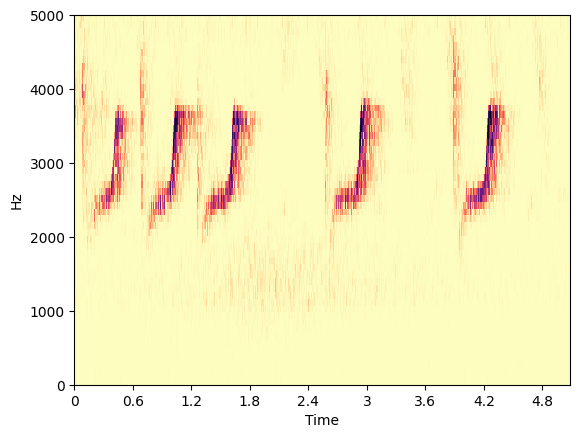

In [384]:
x,sr = sf.read("../audio/Tailorbird.wav")
x = x/np.max(x)
fig,ax = plt.subplots(nrows=1,ncols=1)
c=1e-6
spec,f,t,_= plt.specgram(x,Fs=sr,cmap="magma_r",scale="linear",NFFT=512,noverlap=64)
librosa.display.specshow(np.log1p(spec/c),sr=sr,x_axis='time', y_axis='linear',cmap="magma_r",ax=ax)
ax.set_ylim([0,5000])
plt.show()

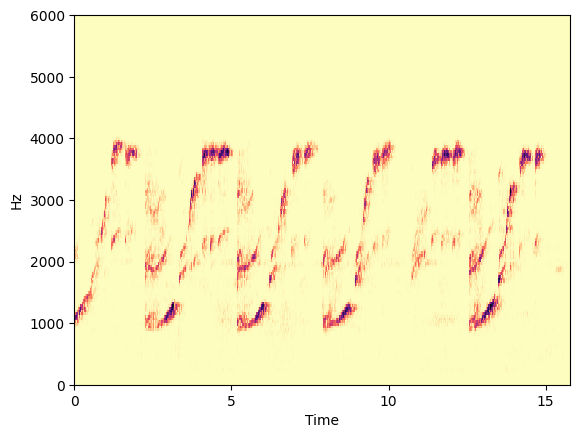

In [411]:
x,sr = sf.read("../audio/GreatTit.wav")
x = x/np.max(x)
fig,ax = plt.subplots(nrows=1,ncols=1)
c=1e-6
spec,f,t,_= plt.specgram(x,Fs=sr,cmap="magma_r",scale="linear",NFFT=512,noverlap=64)
librosa.display.specshow(np.log1p(spec/c),x_axis='time', y_axis='linear',cmap="magma_r",ax=ax)
ax.set_ylim([0,6000])
plt.show()

In [31]:
sound_dir = "../audio/reconstructed_bird_q12/" 
original,sr = sf.read("../audio/laughinggull.wav")
reconstructed_bird = {}
for file in os.listdir(sound_dir):
    if file[-4:]==".wav":
        mode = file.split("_")[1]
        j = int(file.split("_")[3][1:])
        q = int(file.split("_")[4][1:])
        t = int(file.split("_")[5].split(".")[0][1:])
        recon,sr = sf.read(os.path.join(sound_dir,file))
        N = len(recon)
        reconstructed_bird[(mode,j,q,t)] = recon
        print(mode,j,q,t,len(recon))

timesc 12 12 15 131072
timesc 12 12 14 131072
timesc 12 12 13 131072
jtfs 12 12 13 131072
jtfs 12 12 15 131072
jtfs 12 12 14 131072


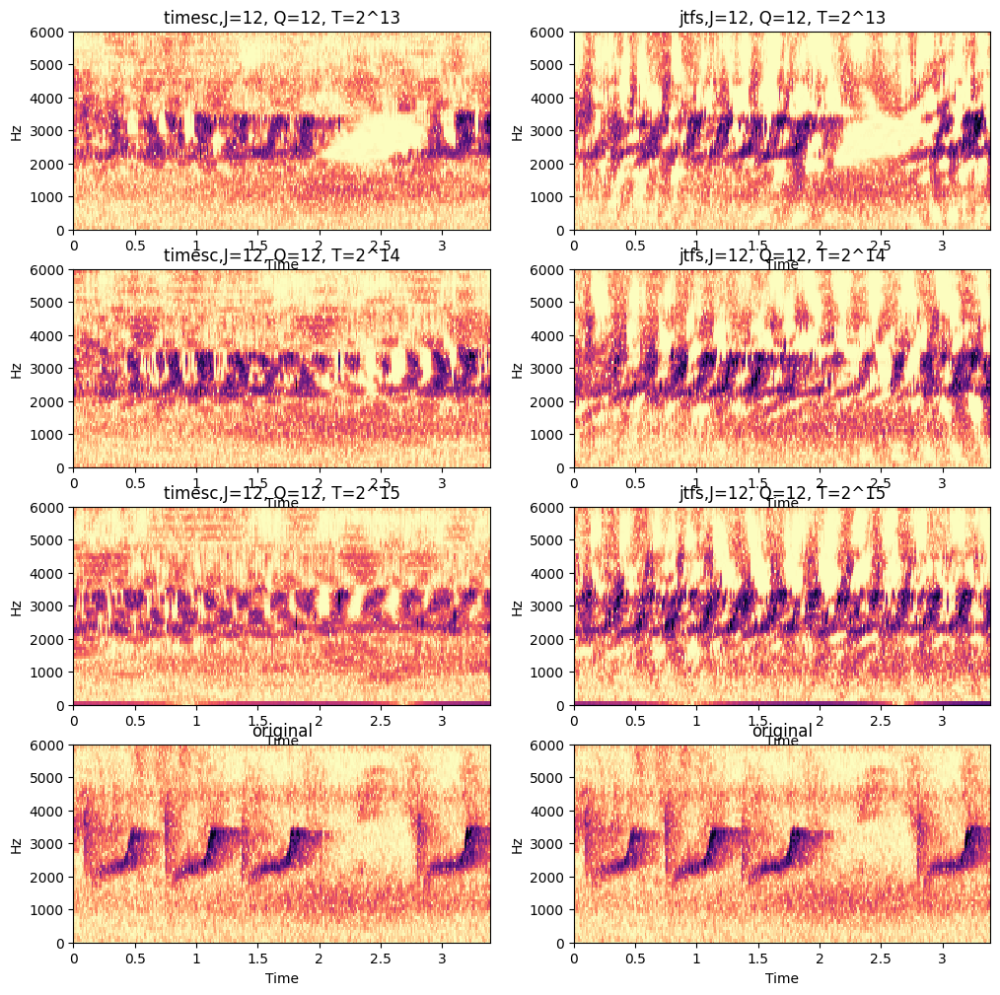

In [461]:
j = 12
q = 12
T = [13,14,15]
fig,axes = plt.subplots(nrows=len(T)+1,ncols=2,figsize=(12,12))
c=1e-10
for b,t in enumerate(T):
    spec1,_,_,_ = plt.specgram(reconstructed_bird[("timesc",j,q,t)],Fs=sr,cmap="magma_r",scale="linear",NFFT=512,noverlap=64)
    librosa.display.specshow(np.log1p(spec1/c),x_axis='time',sr =sr, y_axis='linear',cmap="magma_r",ax=axes[b,0])
    axes[b,0].set_ylim([0,6000])
    #axes[b,0].set_xlim([0,4])
    axes[b,0].set_title("timesc,J="+str(j)+", Q="+str(q)+", T=2^"+str(t))
    spec2,_,_,_ = plt.specgram(reconstructed_bird[("jtfs",j,q,t)],Fs=sr,cmap="magma_r",scale="linear",NFFT=512,noverlap=64)
    librosa.display.specshow(np.log1p(spec2/c),x_axis='time',sr =sr, y_axis='linear',cmap="magma_r",ax=axes[b,1])
    axes[b,1].set_ylim([0,6000])
    #axes[b,1].set_xlim([0,4])
    axes[b,1].set_title("jtfs,J="+str(j)+", Q="+str(q)+", T=2^"+str(t))

spec3,_,_,_ = plt.specgram(original[:N],Fs=sr,cmap="magma_r",scale="linear",NFFT=512,noverlap=64)
librosa.display.specshow(np.log1p(spec3/c),x_axis='time',sr =sr, y_axis='linear',cmap="magma_r",ax=axes[3,0])
axes[3,0].set_ylim([0,6000])
#axes[3,0].set_xlim([0,4])
axes[3,0].set_title("original")
spec4,_,_,_ = plt.specgram(original[:N],Fs=sr,cmap="magma_r",scale="linear",NFFT=512,noverlap=64)
librosa.display.specshow(np.log1p(spec4/c),x_axis='time',sr =sr, y_axis='linear',cmap="magma_r",ax=axes[3,1])
axes[3,1].set_ylim([0,6000])
#axes[3,1].set_xlim([0,4])
axes[3,1].set_title("original")
plt.show()

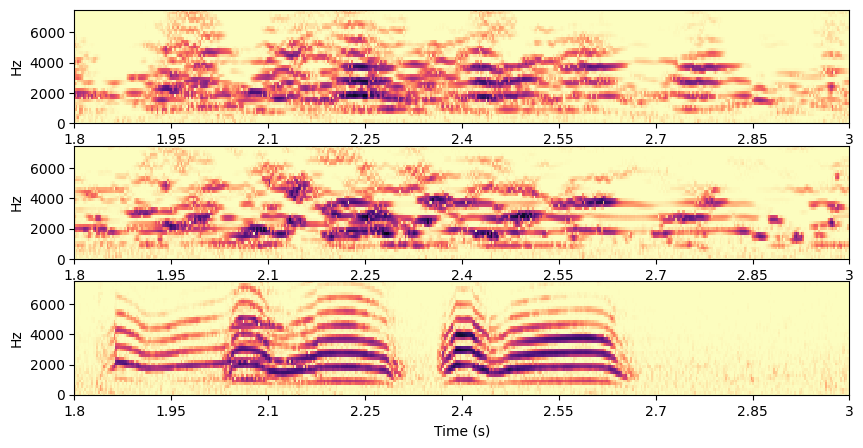

In [36]:
c=1e-7

fig,axes = plt.subplots(nrows=3,ncols=1,figsize=(10,5))
x,sr = sf.read("../audio/reconstructed_jtfs_gull_j12_q12_t13.wav")
spec1,_,_,_ = plt.specgram(x,Fs=sr,cmap="magma_r",scale="linear")#,NFFT=218,noverlap=64)
librosa.display.specshow(np.log1p(spec1/c),x_axis='s',sr =sr,hop_length=128,
                         y_axis='linear',cmap="magma_r",ax=axes[0])
axes[0].set_ylim([0,7500])
axes[0].set_xlim([1.8,3])
#axes[0].set_title("timesc,J="+str(j)+", Q="+str(q)+", T=2^"+str(t))
x2,sr = sf.read("../audio/reconstructed_timesc_gull_j12_q12_t13.wav")
spec2,_,_,_ = plt.specgram(x2,Fs=sr,cmap="magma_r",scale="linear")#,NFFT=218,noverlap=64)
librosa.display.specshow(np.log1p(spec2/c),x_axis='s',sr =sr,hop_length=128,
                         y_axis='linear',cmap="magma_r",ax=axes[1])
axes[1].set_ylim([0,7500])
axes[1].set_xlim([1.8,3])
#axes[1].set_title("jtfs,J="+str(j)+", Q="+str(q)+", T=2^"+str(t))
x3,sr = sf.read("../audio/laughinggull.wav")
x3 = np.mean(x3,axis=1)
spec3,_,_,_ = plt.specgram(x3,Fs=sr,cmap="magma_r",scale="linear")#,NFFT=218,noverlap=64)
librosa.display.specshow(np.log1p(spec3/c),x_axis='s',sr =sr, hop_length=128,
                         y_axis='linear',cmap="magma_r",ax=axes[2])
axes[2].set_ylim([0,7500])
axes[2].set_xlim([1.8,3])
#axes[2].set_title("original")
plt.show()

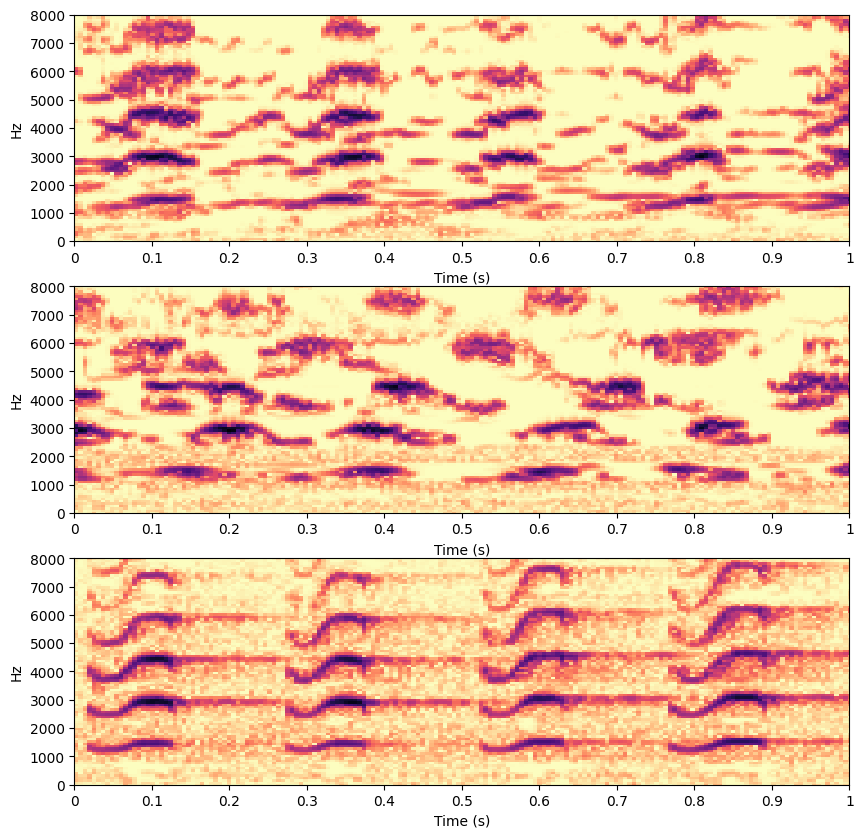

In [28]:
c=1e-10
import librosa.display
fig,axes = plt.subplots(nrows=3,ncols=1,figsize=(10,10))
x,sr = sf.read("../audio/reconstructed_jtfs_acc_j12_q12_t13.wav")
spec1,_,_,_ = plt.specgram(x,Fs=sr,cmap="magma_r",scale="linear")#,NFFT=218,noverlap=64)
librosa.display.specshow(np.log1p(spec1/c),x_axis='s',sr =sr, hop_length=128,
                         y_axis='linear',cmap="magma_r",ax=axes[0])
axes[0].set_ylim([0,8000])
axes[0].set_xlim([0,1])
#axes[0].set_title("timesc,J="+str(j)+", Q="+str(q)+", T=2^"+str(t))
x2,sr = sf.read("../audio/reconstructed_timesc_acc_j12_q12_t13.wav")
spec2,_,_,_ = plt.specgram(x2,Fs=sr,cmap="magma_r",scale="linear")#,NFFT=218,noverlap=64)
librosa.display.specshow(np.log1p(spec2/c),x_axis='s',sr =sr, hop_length=128,
                         y_axis='linear',cmap="magma_r",ax=axes[1])
axes[1].set_ylim([0,8000])
axes[1].set_xlim([0,1])
#axes[1].set_title("jtfs,J="+str(j)+", Q="+str(q)+", T=2^"+str(t))
x3,sr = sf.read("../audio/media_accipiter.wav")
spec3,_,_,_ = plt.specgram(x3,Fs=sr,cmap="magma_r",scale="linear")#,NFFT=218,noverlap=64)
librosa.display.specshow(np.log1p(spec3/c),x_axis='s',sr =sr,hop_length=128,
                         y_axis='linear',cmap="magma_r",ax=axes[2])
axes[2].set_ylim([0,8000])
axes[2].set_xlim([0,1])
#axes[2].set_title("original")
plt.show()

<Figure size 640x480 with 0 Axes>

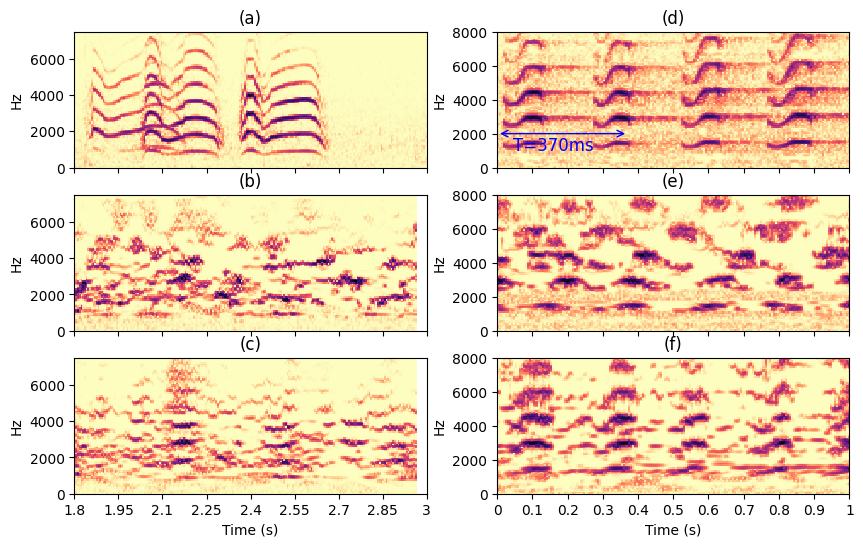

In [34]:
c=1e-7

fig,axes = plt.subplots(nrows=3,ncols=2,figsize=(10,6))
x,sr = librosa.load("../audio/laughinggull.wav",sr=22050)
if len(x.shape)>1:
    x = np.mean(x,axis=1)
spec1,_,_,_ = plt.specgram(x,Fs=sr,cmap="magma_r",scale="linear")#,NFFT=218,noverlap=64)
librosa.display.specshow(np.log1p(spec1/c),x_axis='s',sr =sr,hop_length=128,
                         y_axis='linear',cmap="magma_r",ax=axes[0,0])
axes[0,0].set_ylim([0,7500])
axes[0,0].set_xlim([1.8,3])
axes[0,0].set_title("(a)")

axes[0,0].set_xlabel("")
axes[0,0].set_xticklabels([])
#axes[0].set_title("timesc,J="+str(j)+", Q="+str(q)+", T=2^"+str(t))
x2,sr = sf.read("../audio/reconstructed_timesc_gull_j12_q12_t13.wav")
spec2,_,_,_ = plt.specgram(x2,Fs=sr,cmap="magma_r",scale="linear")#,NFFT=218,noverlap=64)
librosa.display.specshow(np.log1p(spec2/c),x_axis='s',sr =sr,hop_length=128,
                         y_axis='linear',cmap="magma_r",ax=axes[1,0])
axes[1,0].set_ylim([0,7500])
axes[1,0].set_xlim([1.8,3])
axes[1,0].set_title("(b)")
axes[1,0].set_xticklabels([])
axes[1,0].set_xlabel("")
#axes[1].set_title("jtfs,J="+str(j)+", Q="+str(q)+", T=2^"+str(t))
x3,sr = sf.read("../audio/reconstructed_jtfs_gull_j12_q12_t13.wav")
spec3,_,_,_ = plt.specgram(x3,Fs=sr,cmap="magma_r",scale="linear")#,NFFT=218,noverlap=64)
librosa.display.specshow(np.log1p(spec3/c),x_axis='s',sr =sr, hop_length=128,
                         y_axis='linear',cmap="magma_r",ax=axes[2,0])
axes[2,0].set_ylim([0,7500])
axes[2,0].set_xlim([1.8,3])
axes[2,0].set_title("(c)")
axes[2,0].arrow(2*sr,2000,2**13/sr,2,shape="full")
#axes[2,0].annotate("T", xy=(0, 2000), xytext=(0,0),
#            arrowprops=dict(arrowstyle="<->"))
#axes[2].set_title("original")


c=1e-10

x,sr = sf.read("../audio/media_accipiter.wav")
spec1,_,_,_ = plt.specgram(x,Fs=sr,cmap="magma_r",scale="linear")#,NFFT=218,noverlap=64)
librosa.display.specshow(np.log1p(spec1/c),x_axis='s',sr =sr, hop_length=128,
                         y_axis='linear',cmap="magma_r",ax=axes[0,1])
axes[0,1].set_ylim([0,8000])
axes[0,1].set_xlim([0,1])
axes[0,1].set_title("(d)")
axes[0,1].set_xlabel("")
axes[0,1].annotate('', xy=(0,2000), xytext=(2**13/22050, 2000),
            arrowprops=dict(arrowstyle='<->', color='blue'),fontsize=12,weight=10)
axes[0,1].annotate("T=370ms", xy=(2**10/22050, 1000),fontsize=12,weight=15,color='blue')
axes[0,1].set_xticklabels([])
#axes[0].set_title("timesc,J="+str(j)+", Q="+str(q)+", T=2^"+str(t))
x2,sr = sf.read("../audio/reconstructed_timesc_acc_j12_q12_t13.wav")
spec2,_,_,_ = plt.specgram(x2,Fs=sr,cmap="magma_r",scale="linear")#,NFFT=218,noverlap=64)
librosa.display.specshow(np.log1p(spec2/c),x_axis='s',sr =sr, hop_length=128,
                         y_axis='linear',cmap="magma_r",ax=axes[1,1])
axes[1,1].set_ylim([0,8000])
axes[1,1].set_xlim([0,1])
axes[1,1].set_title("(e)")
axes[1,1].set_xlabel("")
axes[1,1].set_xticklabels([])
#axes[1].set_title("jtfs,J="+str(j)+", Q="+str(q)+", T=2^"+str(t))
x3,sr = sf.read("../audio/reconstructed_jtfs_acc_j12_q12_t13.wav")
spec3,_,_,_ = plt.specgram(x3,Fs=sr,cmap="magma_r",scale="linear")#,NFFT=218,noverlap=64)
librosa.display.specshow(np.log1p(spec3/c),x_axis='s',sr =sr,hop_length=128,
                         y_axis='linear',cmap="magma_r",ax=axes[2,1])
axes[2,1].set_ylim([0,8000])
axes[2,1].set_xlim([0,1])
axes[2,1].set_title("(f)")
#axes[2,1].arrow(0,2000,2**13/22050,2,shape="full",length_includes_head=True)
#axes[2,1].annotate("T", xy=(0, 2000), xytext=(0,0),
#            arrowprops=dict(arrowstyle="<->"))
#axes[2].set_title("original")
plt.show()
plt.tight_layout()

In [42]:
import time
start = time.time()
a=2**10
end = time.time()
print(end-start)

7.104873657226562e-05


<Figure size 640x480 with 0 Axes>

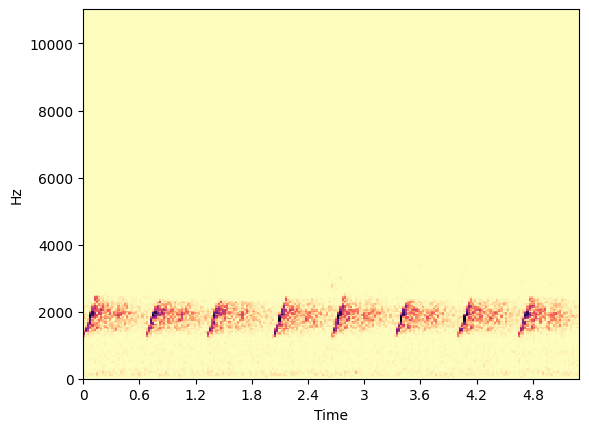

In [94]:
x,sr = sf.read("../audio/LittleSpiderhunter.wav")
x = np.mean(x,axis=1)
x = x/np.max(x)
fig,ax = plt.subplots(nrows=1,ncols=1)
c=1e-6
spec,f,t,_= plt.specgram(x,Fs=sr,cmap="magma_r",scale="linear",NFFT=512,noverlap=64)
librosa.display.specshow(np.log1p(spec/c),x_axis='time', y_axis='linear',cmap="magma_r",ax=ax)
#ax.set_ylim([0,4000])
plt.show()

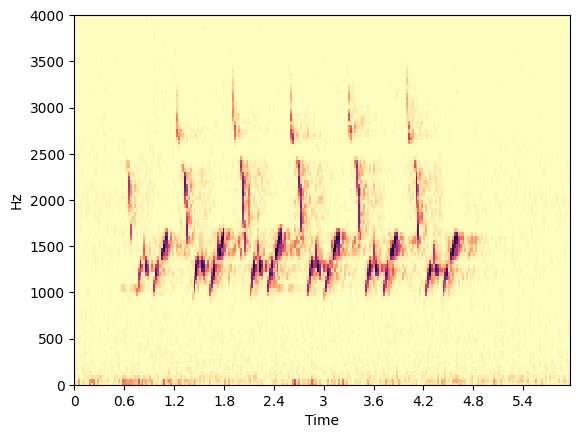

In [378]:
x,sr = sf.read("../audio/carolinabird.wav")
x = np.mean(x,axis=1)
x = x/np.max(x)
fig,ax = plt.subplots(nrows=1,ncols=1)
c=1e-6
spec,f,t,_= plt.specgram(x,Fs=sr,cmap="magma_r",scale="linear",NFFT=512,noverlap=64)
librosa.display.specshow(np.log1p(spec/c),x_axis='time', y_axis='linear',cmap="magma_r",ax=ax)
ax.set_ylim([0,4000])
plt.show()

In [ ]:
#flute original comparison for tremolo extraction
#contact call comparison for pitch glide directionality preservatioon
#spiegel patch comparison for amplitude modulation preservation? (should be the same)

In [462]:
fig,axes = plt.subplots(nrows=3,ncols=3,figsize=(10,10))
j = 12
t = 15
c = 1e-5
for i,audio_dict in enumerate([reconstructed_flute,reconstructed_contact,reconstructed_spiegel]):
    if i == 0:
        q = 12
        name = "flute"
        original,sr = sf.read("../audio/flute_original.wav")
        low,high = [0,2000]
    elif i == 1:
        q = 8
        name = "chick contact call"
        original,sr = sf.read("../audio/contact_call.wav")
        original = np.mean(original,axis=1)
        low,high = [1000,6000]
    else:
        q = 12
        name = "modular synth music"
        original,sr = sf.read("../audio/spiegel-patchwork.wav")
        low,high = [0,750]
        
    
    spec1,_,_,_ = plt.specgram(audio_dict[("timesc",j,q,t)],Fs=sr,cmap="magma_r",scale="linear",NFFT=512,noverlap=64)
    librosa.display.specshow(np.log1p(spec1/c),x_axis='time',sr =sr, y_axis='linear',cmap="magma_r",ax=axes[i,0])
    axes[i,0].set_ylim([low,high])
    axes[i,0].set_ylabel("Frequency (Hz)")
    axes[i,0].set_title("Second order time scattering")
    
    spec2,_,_,_ = plt.specgram(audio_dict[("jtfs",j,q,t)],Fs=sr,cmap="magma_r",scale="linear",NFFT=512,noverlap=64)
    librosa.display.specshow(np.log1p(spec2/c),x_axis='time', sr=sr,y_axis='linear',cmap="magma_r",ax=axes[i,1])
    axes[i,1].set_ylim([low,high])
    axes[i,1].set_title("JTFS")
    #axes[i,1].set_xlabel("Time (s)")
    
    N = len(audio_dict[("jtfs",j,q,t)])
    
    spec3,_,_,_ = plt.specgram(original[:N],Fs=sr,cmap="magma_r",scale="linear",NFFT=512,noverlap=64)
    librosa.display.specshow(np.log1p(spec3/c),x_axis='time',sr=sr, y_axis='linear',cmap="magma_r",ax=axes[i,2])
    axes[i,2].set_ylim([low,high])
    if i == 2:
        axes[i,2].set_xlim([0,3])
    axes[i,2].set_title("Scalogram "+name)
    #axes[i,2].set_xlabel("Time (s)")
    
    if i==2:
        axes[i,0].set_xlabel("Time (s)")
        axes[i,1].set_xlabel("Time (s)")
        axes[i,2].set_xlabel("Time (s)")
plt.tight_layout()

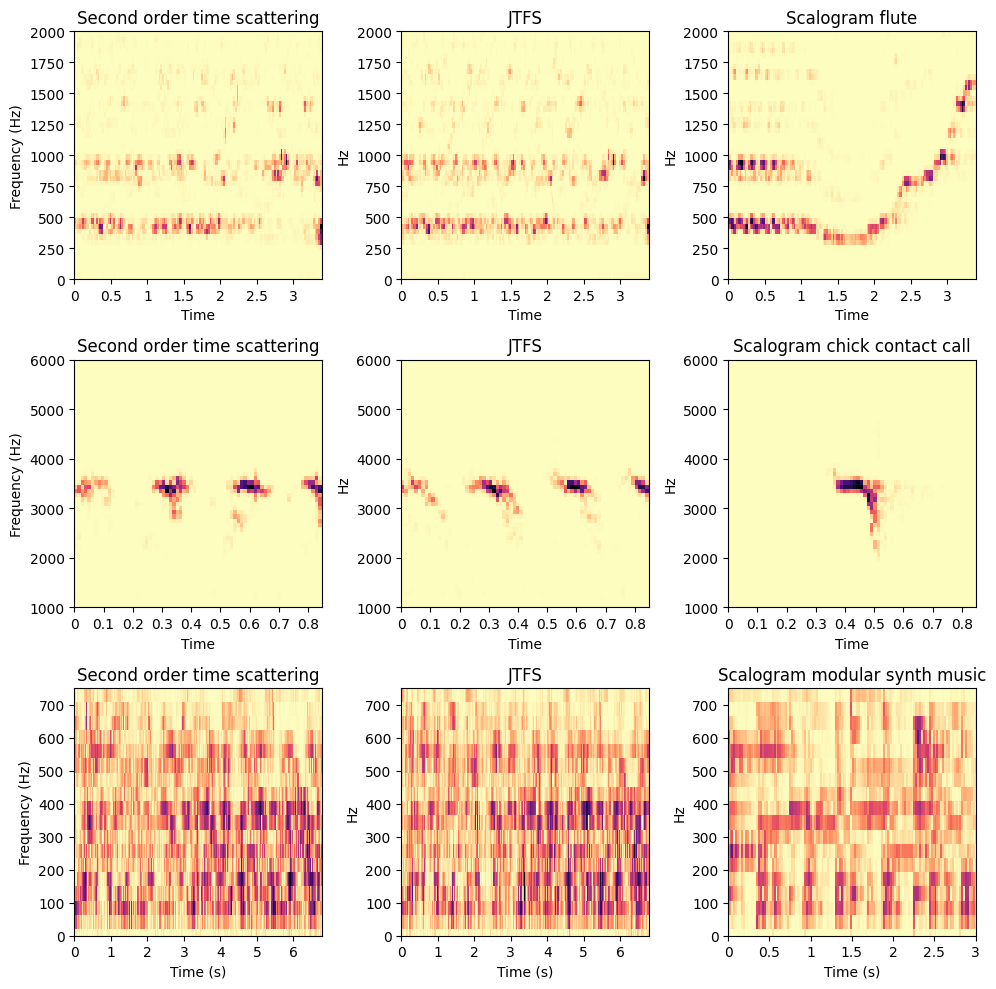

In [463]:
plt.show()